# Neighborhood Dynamics

The geosnap package is designed for geodemographic analysis and regionalization applied to longitudinal data. Following those analyses, it also provides tools for modeling neighborhood composition into the future using spatial and temporal transition rules learned from the past.

In [1]:
%load_ext watermark
%watermark -v -a "author: eli knaap" -d -u -p segregation,libpysal,geopandas,geosnap

Author: author: eli knaap

Last updated: 2024-01-23

Python implementation: CPython
Python version       : 3.11.0
IPython version      : 8.18.1

segregation: 2.5
libpysal   : 4.9.2
geopandas  : 0.14.2
geosnap    : 0.12.1.dev9+g3a1cb0f6de61.d20240110



In [2]:
from geosnap import DataStore
from geosnap.io import get_acs
from geosnap.analyze import cluster, regionalize, find_k

In [3]:
from geosnap.visualize import plot_timeseries, animate_timeseries

In [4]:
import geopandas as gpd

## Examining Data

In [5]:
store = DataStore()

The DataStore class provides access to hundreds of neighbrohood indicators for the U.S. collected from federal agencies. We store these datasets in the cloud and stream them on demand. But if you plan on doing repeated analyses you can store the data locally (which we've already done on the JupyterHub)

In [6]:
chicago = get_acs(store, county_fips='17031', level='tract', years=list(range(2013, 2017)))  # without specifying a subset of years, we get everything

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/io/constructors.py:188: UserWarning: `constant_dollars` is True, but no `currency_year` was specified. Resorting to max value of 2016
  warn(


In [7]:
chicago.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5276 entries, 0 to 5275
Columns: 161 entries, geoid to p_vietnamese_persons
dtypes: float64(158), geometry(1), int64(1), object(1)
memory usage: 6.5+ MB


In [8]:
chicago.head()

,geoid,n_mexican_pop,n_cuban_pop,n_puerto_rican_pop,n_russian_pop,n_italian_pop,n_german_pop,n_irish_pop,n_scandaniavian_pop,n_foreign_born_pop,...,n_chinese_persons,n_filipino_persons,n_japanese_persons,n_korean_persons,n_vietnamese_persons,p_chinese_persons,p_filipino_persons,p_japanese_persons,p_korean_persons,p_vietnamese_persons
0,17031010100,235.0,0.0,84.0,0.0,31.0,78.0,21.0,0.0,996.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17031010201,1745.0,0.0,38.0,60.0,81.0,31.0,63.0,0.0,2530.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,17031010202,480.0,16.0,6.0,8.0,34.0,104.0,55.0,0.0,676.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,17031010300,636.0,54.0,16.0,152.0,38.0,138.0,190.0,0.0,1951.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,17031010400,269.0,79.0,67.0,20.0,111.0,206.0,177.0,0.0,822.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


There are also convenient plotting methods for looking at change over time. A useful feature here is that the choropleth bins are the same for each time period, making it easy to see change over time

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/mapping.py:170: UserWarning: `proplot` is not installed.  Falling back to matplotlib
  warn("`proplot` is not installed.  Falling back to matplotlib")


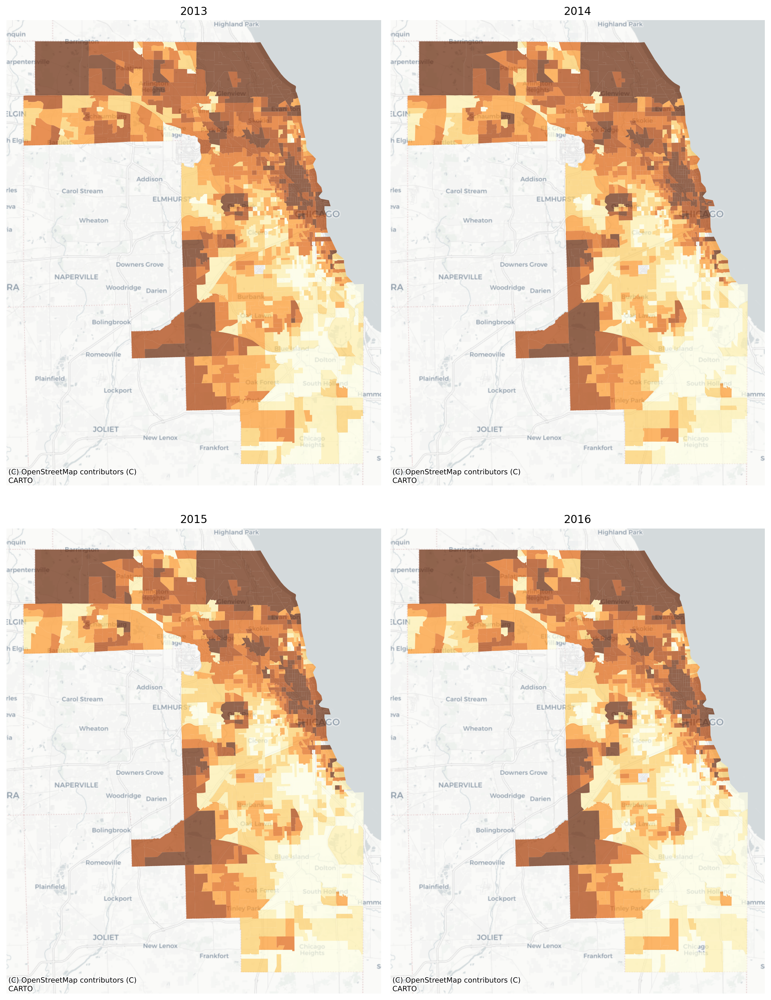

In [9]:
import matplotlib.pyplot as plt
plot_timeseries(chicago, "median_home_value", scheme='quantiles', k=7, nrows=2, ncols=2, cmap='YlOrBr', figsize=(12,16), legend=False)
plt.tight_layout()

Still it can be difficult to see minute changes across the various maps. The `animate_timeseries` function can make it easier to see what's happening, like the steady income decline in Midlothian near the southern edge of the region

In [10]:
animate_timeseries(chicago, 'median_home_value', scheme='quantiles', k=7, cmap='YlOrBr', filename='images/chicago_income_change.gif', fps=1.5)

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

![Home Value Change in Chicago](images/chicago_income_change.gif){width=800}

Note here that we're comparing overlapping samples from the ACS 5-year survey, which the Census Bureau recommends against. Here it just makes a good example :)

## Modeling Neighborhood Types

With `geosnap`, it's possible to look at *temporal* geodemographics without writing much code. Under the hood, the package provides tools for scaling each dataset within its own time period, adjusting currency values for inflation, and ensuring that times, variables, and geometries stay aligned properly. Together those tools make it easy to explore how different portions of the region transition into different neighborhood types over time, and if desired, model the evolution of neighborhood change as a spatial Markov process.

Any variables could be used to examine neighborhood transitions, but we'll return to the simple set of sociodemographic veriables used before to understand if/how patterns of racial and socioeconomic segregation and neighborhood partitioning unfold over time

In [11]:
columns = ['median_household_income', 'median_home_value', 'p_asian_persons', 'p_hispanic_persons', 'p_nonhisp_black_persons', 'p_nonhisp_white_persons']

In [12]:
chicago_ward = cluster(gdf=chicago, columns=columns, method='ward', n_clusters=5)

In [13]:
chicago_ward.head()

,year,geoid,n_mexican_pop,n_cuban_pop,n_puerto_rican_pop,n_russian_pop,n_italian_pop,n_german_pop,n_irish_pop,n_scandaniavian_pop,...,n_filipino_persons,n_japanese_persons,n_korean_persons,n_vietnamese_persons,p_chinese_persons,p_filipino_persons,p_japanese_persons,p_korean_persons,p_vietnamese_persons,ward
0,2013,17031010100,235.0,0.0,84.0,0.0,31.0,78.0,21.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
1,2013,17031010201,1745.0,0.0,38.0,60.0,81.0,31.0,63.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
2,2013,17031010202,480.0,16.0,6.0,8.0,34.0,104.0,55.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
3,2013,17031010300,636.0,54.0,16.0,152.0,38.0,138.0,190.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,2013,17031010400,269.0,79.0,67.0,20.0,111.0,206.0,177.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/mapping.py:170: UserWarning: `proplot` is not installed.  Falling back to matplotlib
  warn("`proplot` is not installed.  Falling back to matplotlib")


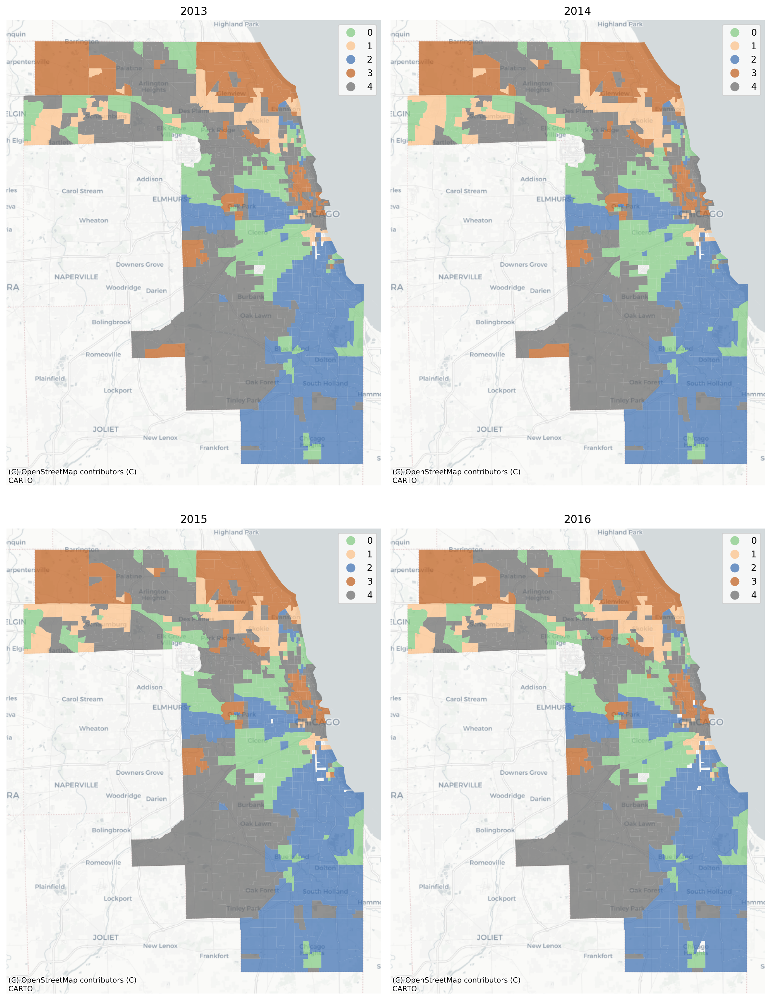

In [14]:
plot_timeseries(chicago_ward, 'ward', categorical=True, nrows=2, ncols=2, figsize=(12,16))
plt.tight_layout()

In [15]:
animate_timeseries(chicago_ward, 'ward', categorical=True, filename='images/chicago_type_change.gif', fps=1.5)

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

The vast majority of tracts are assigned to the same geodemographic type in each time period, but some transition into different types over time. The ones that *do* transition tend to be those on the edges of large contiguous groups (i.e. change tends to happen along the periphery and move inward, implying a certain kind of spatial dynamic)

![Chicago Neighborhood Types](images/chicago_type_change.gif){width=800}

Once we have a temporal geodemographic clustering solution, then the data are represented as a long-form geodataframe with the neighborhood cluster label as one of the attributes. For each observation, then, the neighborhood label is arranged as a sequence of discrete types which can be modeled as a first-order Markov process using [giddy](https://pysal.org/giddy/notebooks/MarkovBasedMethods.html), or using [sequence analysis](https://doi.org/10.1016/j.compenvurbsys.2020.101480)

In [16]:
chicago_ward, chi_model = cluster(chicago, columns=columns, method='ward', n_clusters=6, return_model=True)

In [17]:
type(chi_model)

geosnap.analyze._model_results.ModelResults

Each observation is given its own silhouette score to identify potential spatial outliers, or the measures can be summarized to provide an aggregate statistic

In [18]:
chi_model.silhouette_scores.silhouette_score.mean()

0.35971262107670565

Since the data are indexed by time, we can also examine whether certain time periods have a poorer fit versus others:

In [19]:
chi_model.silhouette_scores.groupby('year').silhouette_score.mean()

year
2013    0.362116
2014    0.361529
2015    0.359077
2016    0.356111
Name: silhouette_score, dtype: float64

## Analyzing Neighborhood Change

With the cluster model in hand, each census tract is represented as a series of neighborhood types over time (i.e. what we plotted above). To understand which neighborhoods have experienced the most change, the `ModelResults` class implements a method called "LINCS", the Local Indicator of Neighborhood Change. The `lincs` attribute measures how often a given spatial unit shares its cluster assignment with the other units over time.

If a "neighborhood" is grouped with many different neighborhoods over time (rather than joining a single group with the same members repeatedly), then it shows more variation and thus a higher LINC score

In [20]:
chi_lincs = chi_model.lincs

In [21]:
chi_lincs

,geoid,geometry,2013,2014,2015,2016,linc
0,17031010100,"MULTIPOLYGON (((-87.67720 42.02294, -87.67628 ...",0.0,0.0,0.0,0.0,0.017857
1,17031010201,"MULTIPOLYGON (((-87.68465 42.01948, -87.68432 ...",0.0,0.0,0.0,0.0,0.017857
2,17031010202,"MULTIPOLYGON (((-87.67683 42.01941, -87.67674 ...",0.0,0.0,0.0,0.0,0.017857
3,17031010300,"MULTIPOLYGON (((-87.67133 42.01937, -87.67121 ...",2.0,2.0,2.0,2.0,0.303371
4,17031010400,"MULTIPOLYGON (((-87.66345 42.01283, -87.66321 ...",2.0,2.0,2.0,2.0,0.303371
...,...,...,...,...,...,...,...
1304,17031843500,"MULTIPOLYGON (((-87.70504 41.84452, -87.70479 ...",0.0,0.0,0.0,0.0,0.017857
1305,17031843600,"MULTIPOLYGON (((-87.61150 41.81128, -87.61125 ...",0.0,0.0,0.0,0.0,0.017857
1306,17031843700,"MULTIPOLYGON (((-87.69683 41.94967, -87.69681 ...",4.0,4.0,4.0,3.0,0.994307
1307,17031843800,"MULTIPOLYGON (((-87.64554 41.80886, -87.64542 ...",0.0,0.0,0.0,0.0,0.017857


<Axes: >

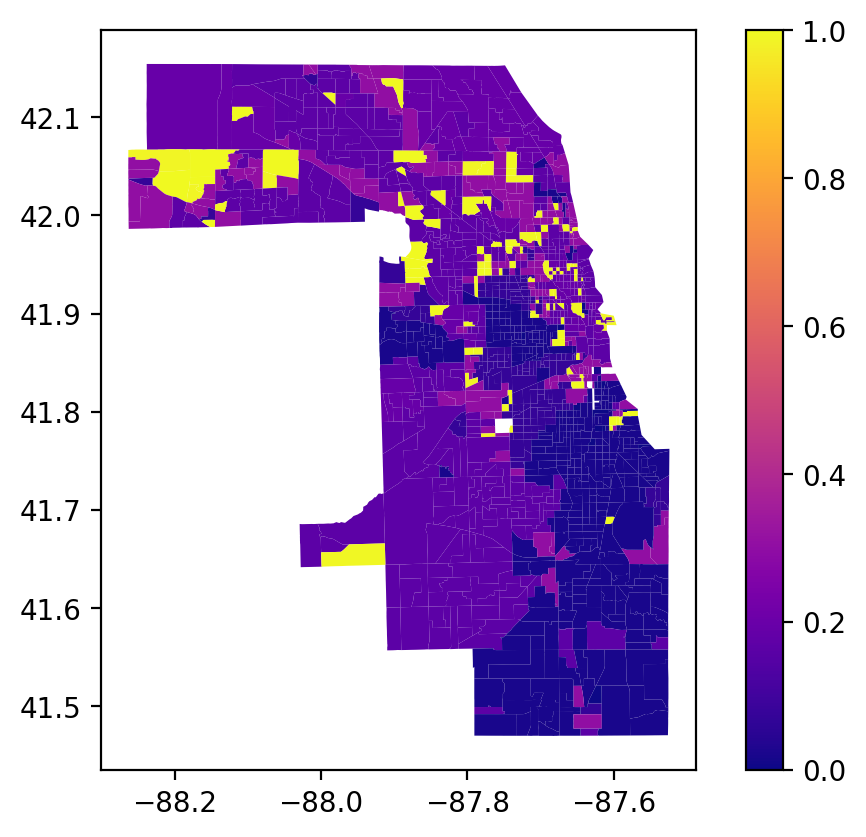

In [22]:
chi_lincs.plot('linc',legend=True, cmap='plasma')

Yellow places have changed the most in our cluster model, and blue places have remained the most stagnant. We can use the LISA statistics from `esda` to locate hotspots of change or stagnation

<Axes: ylabel='Density'>

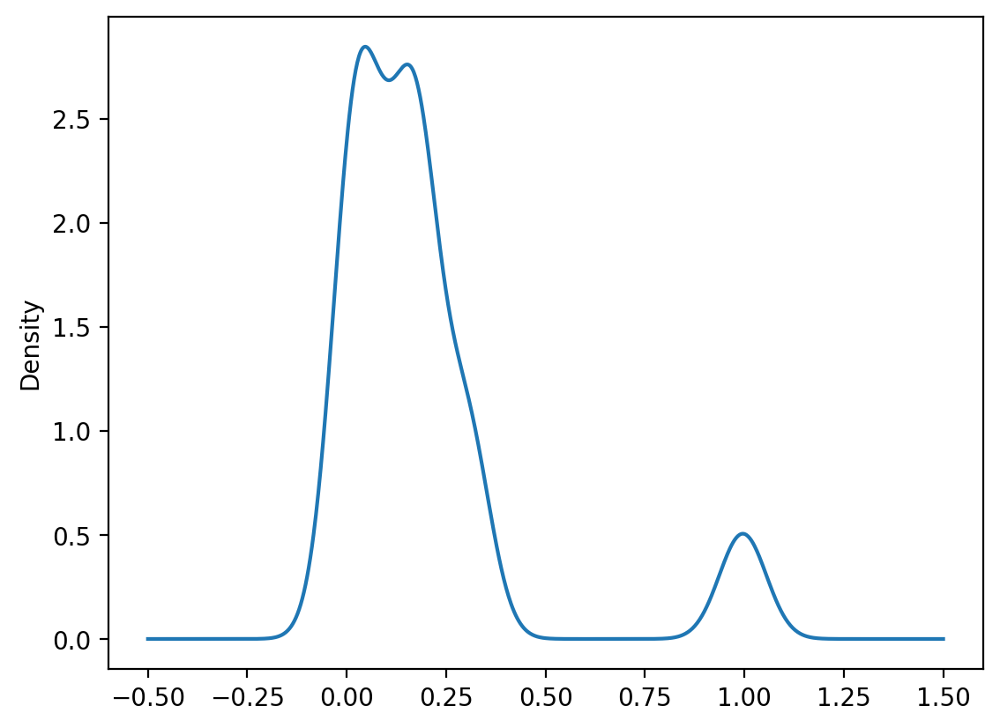

In [23]:
chi_lincs.linc.plot(kind='density')

In [24]:
from esda import Moran_Local

In [25]:
from libpysal.weights import Queen

In [26]:
w = Queen.from_dataframe(chi_model.lincs)

/var/folders/79/cknfb1sx2pv16rztkpg6wzlw0000gn/T/ipykernel_11299/3977480944.py:1: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(chi_model.lincs)


In [27]:
linc_lisa = Moran_Local(chi_lincs.linc, w)

Recall that the LISA statistic measures the association between a focal observation and its neighbors. When we have spatial units (i.e. tracts) with a high LINC score, and their neighboring tracts *also* have high LINC scores, then we've found a local pocket of neighborhood change.

In [28]:
linc_lisa.Is

array([ 0.19094133, -0.38635302, -0.13315014, ...,  2.09900215,
        0.3517673 ,  0.49985707])

<Axes: >

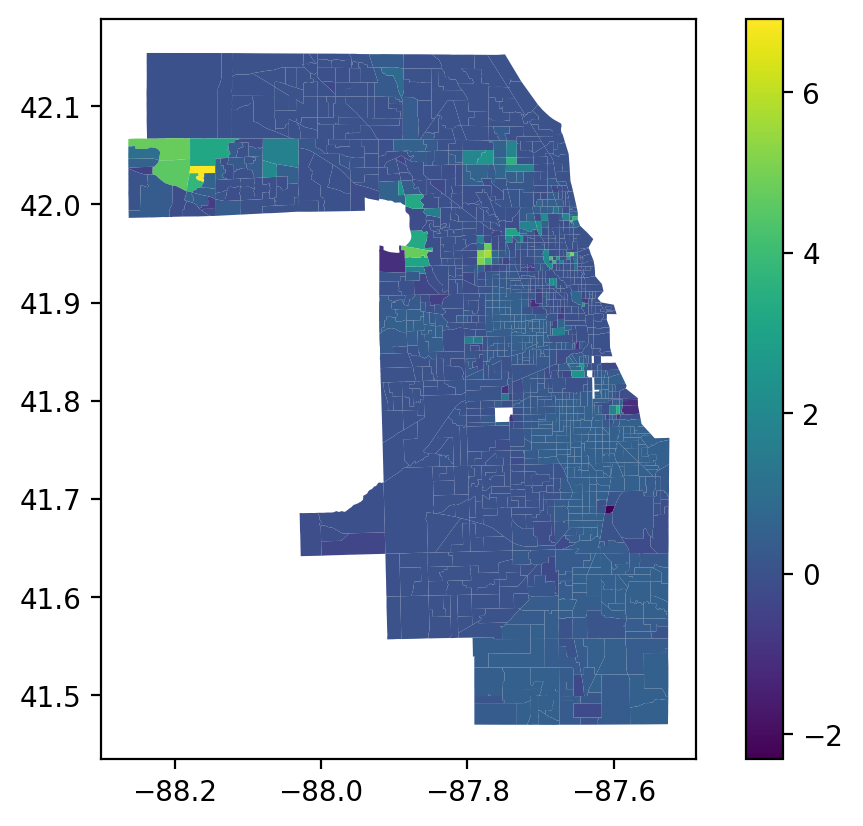

In [29]:
chi_lincs.assign(i=linc_lisa.Is).plot('i', legend=True)

In [30]:
from splot.esda import plot_local_autocorrelation, lisa_cluster

(<Figure size 1500x400 with 3 Axes>,
 array([<Axes: title={'center': 'Moran Local Scatterplot'}, xlabel='Attribute', ylabel='Spatial Lag'>,
        <Axes: >, <Axes: >], dtype=object))

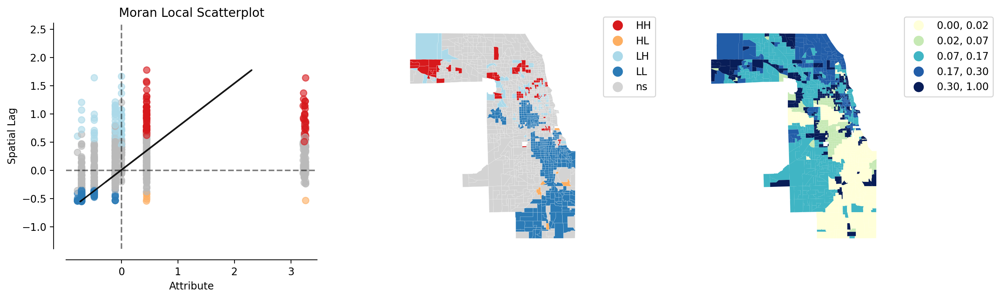

In [31]:
plot_local_autocorrelation(linc_lisa, chi_lincs.to_crs(3857), 'linc')

In [32]:
import contextily as ctx

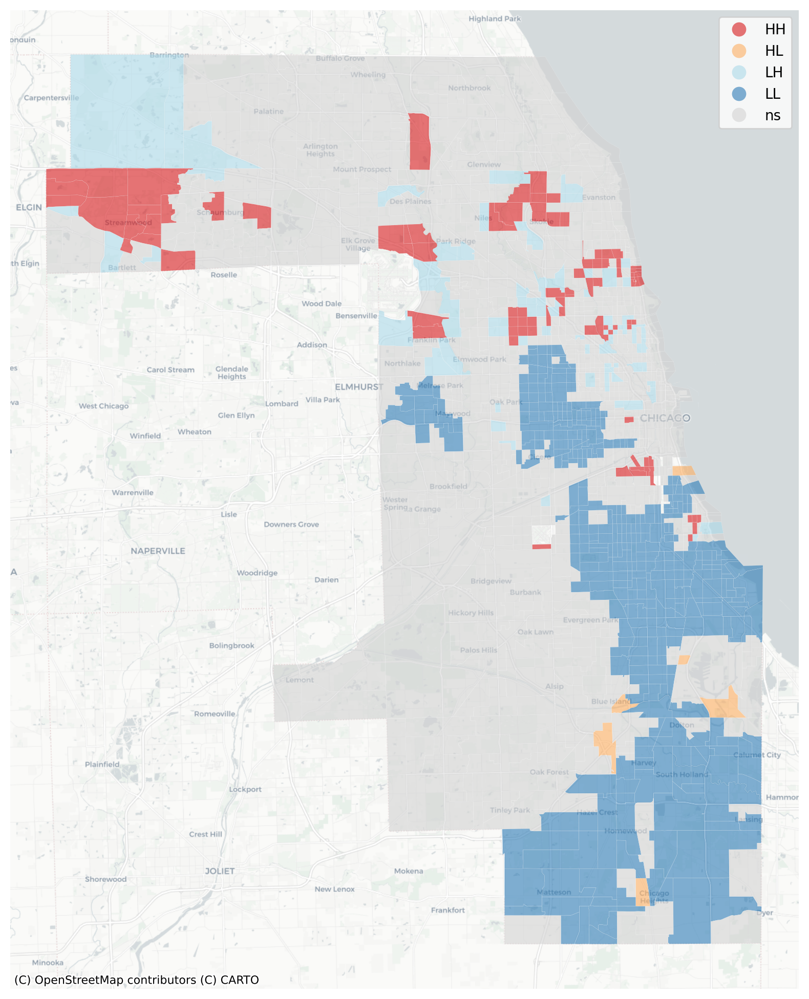

In [33]:
fig, ax = lisa_cluster(linc_lisa, chi_lincs.to_crs(3857), alpha=0.6, figsize=(8,10))
ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron, zoom=11)
fig.tight_layout()

Red areas of high-high clusters of LINC scores are places undergoing change, whereas blue places (low LINC scores surrounded by low scores) are those that have changed very little over time. Orange places are particularly interesting, as they represent local pockets of change surrounded by larger pockets of stagnation.

Substantively, this example shows that Chicago's famously segregated South Side and West Side form large regions of the city that demonstrate little demographic/socioeconomic change, particularly in neighborhoods like Rosewood and West Garfield. By contrast, places like Brideport and Portage Park have witnessed substantial change over the last decade according to this model

## Modeling Neighborhood Transitions

We can also use the sequence of labels to create a spatial Markov transition model. These models examine how often one neighborhood type transitions into another type--then how these transition rates change under different conditions of spatial context

As with the LISA analysis above, a key question of interest concerns whether there is *spatial patterning* in the observed neighborhood transition. If neighborhood transitions are influenced by what occurs nearby, then it suggests the potential influence of spatial spillovers. Although there is nothing 'natural' about it, this phenomenon would be akin to classic sociological models of neighborhood change from the 1920s. Further, if there is evidence that space matters fortransitions, then any attempt to understand neighborhood processes in this region should also consider the importance of spatial interactionl. A natural way to understand the transition between two neighborhood types is the plot the observed transition rates as a heatmap

In [34]:
from geosnap.visualize import plot_transition_matrix

The rows of the matrix define the origin neighborhoods $i$ (i.e. the neighborhood type at $t$) and the columns define the "destination" neighborhood type $j$ (the neighborhood type at $t+1$), for each of the types $k$ and the values of the cells are the fraction of transitions between these two types over all time periods.:

$$
\hat{p}_{i,j} = \frac{n_{i,j}}{\sum_{k=1}^k n_{i,k} }
$$

To operationalize spatial context, we rely on the concept of a modal spatial lag. Since the data are discrete, the modal lag captures the most common value within the local context of each neighborhood, where the context is defined by a PySAL spatial weights object $W$

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/transitions.py:82: UserWarning: Creating a transition model implicitly is deprecated and will be removed in future versions. please pass a giddy.Spatial_Markov instance using `giddy` or `geosnap.analyze.transition`
  warn(
/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/dynamics.py:123: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Ws[w_type].from_dataframe(gpd.GeoDataFrame(gdf_wide), **w_options)


array([<Axes: title={'center': 'Global'}>,
       <Axes: title={'center': 'Modal Neighbor - 0'}>,
       <Axes: title={'center': 'Modal Neighbor - 1'}>,
       <Axes: title={'center': 'Modal Neighbor - 2'}>,
       <Axes: title={'center': 'Modal Neighbor - 3'}>,
       <Axes: title={'center': 'Modal Neighbor - 4'}>,
       <Axes: title={'center': 'Modal Neighbor - 5'}>, <Axes: >, <Axes: >],
      dtype=object)

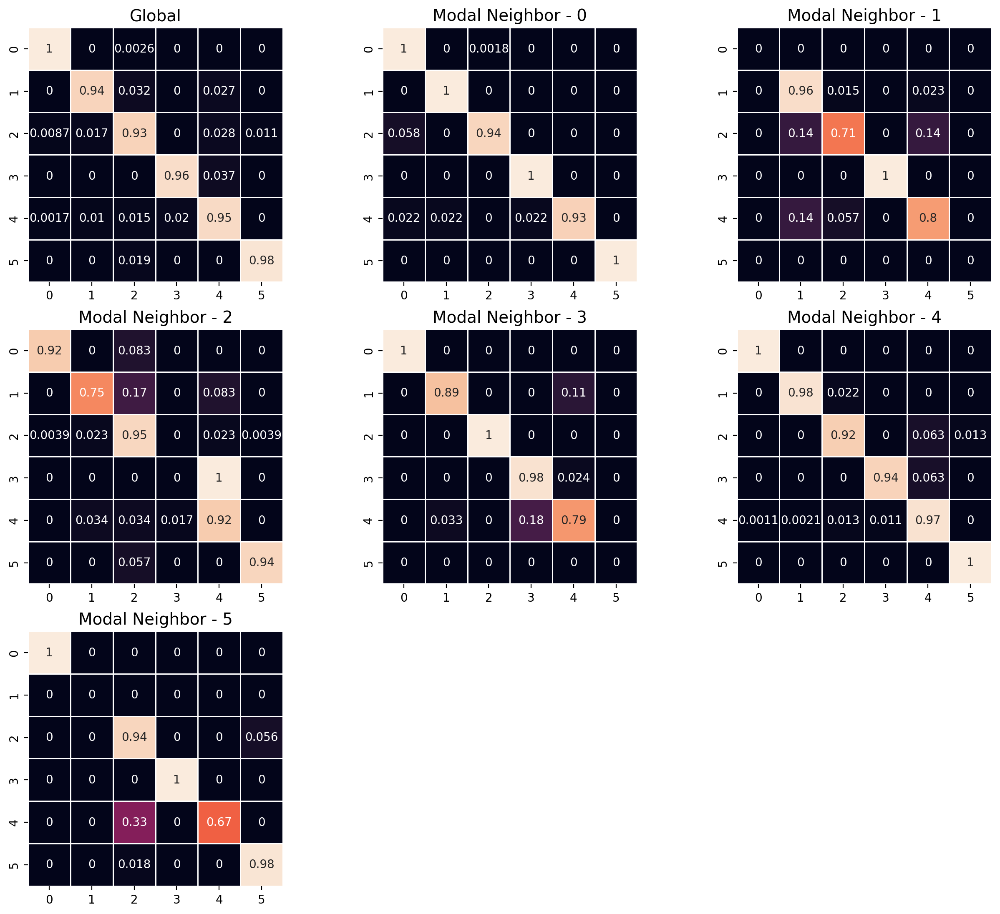

In [35]:
plot_transition_matrix(chicago_ward, cluster_col='ward')

The "Global" heatmap in the upper left shows the overall transition rates between all pairs of neighborhood clusters, and the successive heatmaps show the transition rates conditional on different spatial contexts. The "Modal Neighbor 0" graph shows how the transition rates change when the most common unit surrounding the focal unit is Type 0. The strong diagonal across all heatmaps describes the likelihood of stability; that is, for any neighborhood type, the most common transition is *remaining in its same type*. The fact that the transition matrices are not the same provides superficial evidence that conditional transition rates may differ. To conduct a formal test, we use the giddy model object stored in the `ModelReults`

In [36]:
from geosnap.analyze import transition

In [37]:
# this is the same model as shown in the heatmap

chi_transitions = transition(chicago_ward, cluster_col='ward')

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/dynamics.py:123: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Ws[w_type].from_dataframe(gpd.GeoDataFrame(gdf_wide), **w_options)


In [38]:
type(chi_transitions)

giddy.markov.Spatial_Markov

In [39]:
chi_transitions.LR_p_value

2.1727064591914313e-13

In [40]:
chi_transitions.Q_p_value

0.0

Unsurprisingly, the summary statistics show strong evidence that the transition dynamics differ under different spatial contexts.

In [41]:
chi_transitions.summary()

-------------------------------------------------------------------------
                        Spatial Markov Test: ward                        
-------------------------------------------------------------------------
Number of classes: 6
Number of transitions: 3894
Number of regimes: 6
Regime names: LAG0, LAG1, LAG2, LAG3, LAG4, LAG5
-------------------------------------------------------------------------
   Test                   LR                Chi-2
  Stat.              178.041              405.942
    DOF                   61                   61
p-value                0.000                0.000
-------------------------------------------------------------------------
P(H0)           C0         C1         C2         C3         C4         C5
     C0      0.997      0.000      0.003      0.000      0.000      0.000
     C1      0.000      0.941      0.032      0.000      0.027      0.000
     C2      0.009      0.017      0.935      0.000      0.028      0.011
     C3      0.

And we can use those transition rates to make predictions about future conditions (note this feature is still experimental). To simulate labels into the future, we determine the spatial context for each unit (determined by its local neighborhood via a PySAL Graph) and draw a new label from the conditional transition matrix implied by the units local neighborhood. This amounts to a simple cellular automata model on an irregular lattice, where there is only a single (stochastic) transition rule, whose transition probabilities update each round. It's a bit like a schelling model in that each unit's "preferences" for transition are based on the composition of the values around them, except that there are multiple occupancy types (and muliple "preferences" for those neighborhoods)

In [42]:
future = chi_model.predict_markov_labels(time_steps=10, increment=1)

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/_model_results.py:777: UserWarning: No base_year provided. Using the last period for which labels are known:  2016 
  warn(
/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/dynamics.py:123: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Ws[w_type].from_dataframe(gpd.GeoDataFrame(gdf_wide), **w_options)
/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/dynamics.py:330: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Ws[w_type].from_dataframe(gdf, **w_options)
/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/dynamics.py:392: UserWarning: Falling back to aspatial transition rule for unit 17031831100
  warn(
/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/dynamics.py:392: Us

In [43]:
animate_timeseries(future, 'predicted', categorical=True, filename='images/chicago_predictions.gif', fps=1.5)

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

![Predicted Neighborhood Types in Chicago](images/chicago_predictions.gif){width=800}

From a social equity perspective, these predictions can help inform investments in place that are likely to provide the greatest return, such as providing place-based affordable houising in high-opportunity (but low likelihood of change) or by providing displacement protections in places that show large potential for change. It also allows analysts to examine whether the placement of existing resources, like the current [inventory of assisted housing](https://preservationdatabase.org/) or the [geography of eviction](https://evictionlab.org/map/) is distributed equitably throughout this landscape (and the landscape we expect to emerge). 